# PCA Extraction
El algoritmo parametrico solo es capaz de generar peaks, sin embargo no es capaz de generar la distribución de fondo;
si esta distribución obedece alguna estadistica y se encuentra presente en todo el dataset, sería posible estimar una aproximación a partir de los datos a forma de ser capaces de reducir la función de perdida por pixels 'wmape'

In [1]:
import matplotlib.pyplot as plt
import numpy as np

import os

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

from grav_lens import get_datasets
from grav_lens.models import test_model_image

2024-09-11 11:48:05.301056: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-09-11 11:48:05.322141: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-09-11 11:48:05.511389: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-09-11 11:48:05.697498: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-11 11:48:05.837162: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been 

In [2]:
# Asegurarte de que el batch_size sea 128 o mayor
import tensorflow as tf
import numpy as np
from sklearn.decomposition import IncrementalPCA
import matplotlib.pyplot as plt
from os.path import join
home_data = join("..", "data")
max_files = -1 # maximo de ficheros
batch_size = 256

train_dataset, val_dataset, test_dataset = get_datasets(data_index='1', max_files=max_files, batch_size=batch_size,
    home=home_data)


# Parámetros
image_shape = (128, 128)

Using data folder: ../data/4


In [3]:
for X_batch, y_batch in train_dataset.take(1):
    print(X_batch.shape)

(256, 128, 128, 3)


2024-09-11 11:48:13.464419: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


# IPCA
Esta version incluye el escalado

In [4]:
import pickle 

# Cargar el IPCA desde un archivo pickle
with open('standard_scaler.pkl', 'rb') as f:
    standard_scaler = pickle.load(f)

AttributeError: Can't get attribute 'CustomScaler' on <module '__main__'>

In [97]:


# Crear y aplicar IncrementalPCA
ipca = IncrementalPCA(n_components=256, batch_size=batch_size)

# Extraer imágenes del dataset en lotes y ajustar el IncrementalPCA
for X_batch, y_batch in train_dataset:
    images_batch = y_batch.numpy()  # Convertir a numpy
    
    # Aplanar las imágenes y apilarlas
    images_stack = np.vstack([img.reshape(-1, 128*128) for img in images_batch])

    # Aplicar el ajuste incremental al IPCA
    ipca.partial_fit(images_stack)


Se necesitan 98 componentes para explicar el 90% de la varianza.


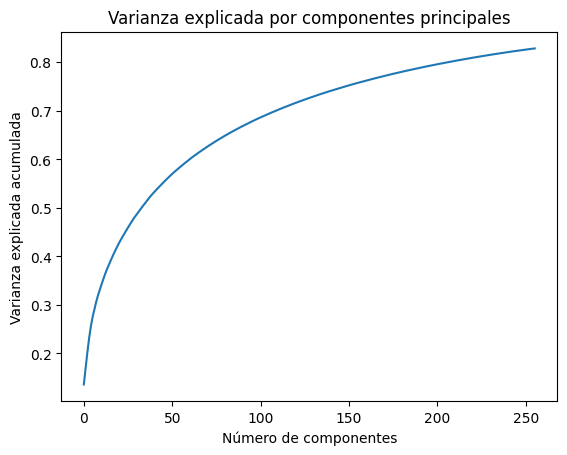

In [101]:

# Calcular la varianza explicada acumulada globalmente después de procesar todo el dataset
explained_variance_ratio = np.cumsum(ipca.explained_variance_ratio_)

# Imprimir la varianza explicada acumulada y el número de componentes necesarios
for i, var in enumerate(explained_variance_ratio):
    if var >= 0.68:  # Si deseas alcanzar el 90% de la varianza explicada
        print(f"Se necesitan {i+1} componentes para explicar el 90% de la varianza.")
        break

# Graficar la varianza explicada acumulada
plt.plot(explained_variance_ratio)
plt.xlabel("Número de componentes")
plt.ylabel("Varianza explicada acumulada")
plt.title("Varianza explicada por componentes principales")
plt.show()


In [94]:
ipca.components_.shape[0]

128

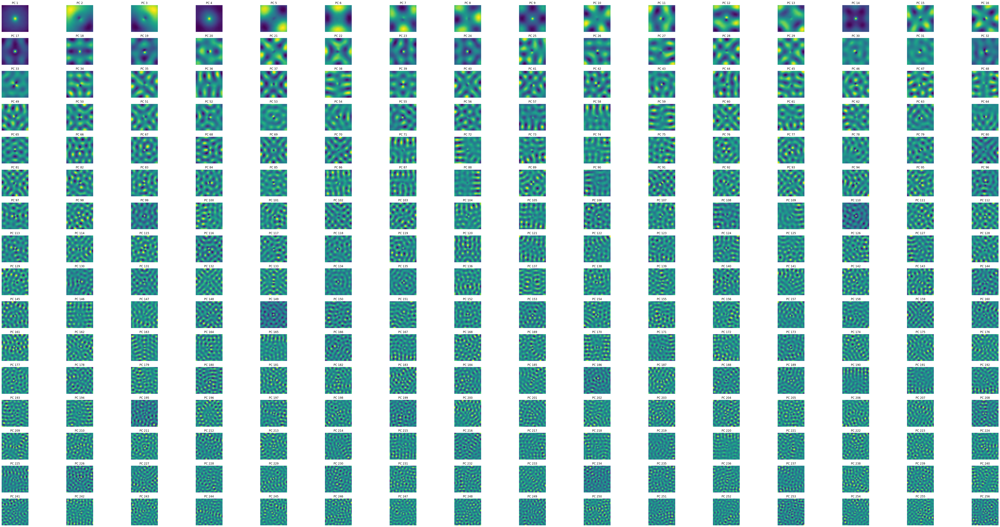

In [105]:
# Mostrar las primeras 50 eigen-imágenes (componentes principales)
n_components_to_show = 256  # Cambiar esto a 50
eigen_images = ipca.components_[:n_components_to_show].reshape((n_components_to_show, 128, 128))

# Visualizar las 50 primeras eigen-imágenes
fig, axes = plt.subplots(16, 16, figsize=(64, 32))  # Crear una cuadrícula de 5 filas x 10 columnas
for i, ax in enumerate(axes.flat):
    if i < n_components_to_show:
        ax.imshow(eigen_images[i])
        ax.set_title(f'PC {i+1}')
    ax.axis('off')  # Ocultar los ejes para una visualización más limpia
plt.tight_layout()
plt.show()


In [156]:
import pickle

# Guardar el IPCA en un archivo pickle
with open('ipca_model.pkl', 'wb') as f:
    pickle.dump(ipca, f)

# Reconstruccion

In [8]:
from sklearn.metrics import mean_squared_error
from grav_lens.metrics import WMAPE, DICEE

In [9]:
import tensorflow as tf

In [13]:

# Cargar el IPCA desde un archivo pickle
with open('ipca_model.pkl', 'rb') as f:
    ipca = pickle.load(f)

Error de reconstrucción MSE promedio en el batch: 1080.272705078125
Error de reconstrucción WMAPE promedio en el batch: 0.00020389620392126807
Error de reconstrucción DICEE 0.1554822325706482


2024-09-11 11:34:13.722769: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


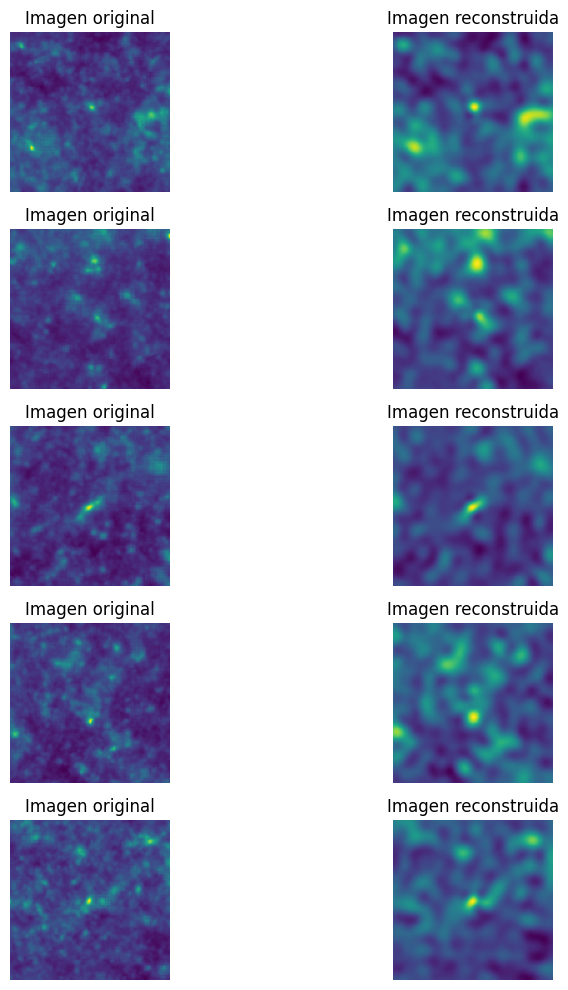

In [14]:


# Reducir y reconstruir las imágenes para un batch
for X_batch, y_batch in train_dataset.take(1):  # Tomamos solo un batch de prueba
    images_batch = y_batch.numpy()  # Convertir a numpy
    
    # Aplanar las imágenes para aplicar el PCA
    flat_images = np.array([img.flatten() for img in images_batch])

    # Transformar las imágenes al espacio de componentes principales (reduce dimensionalidad)
    pca_components = ipca.transform(flat_images)  # (batch_size, n_comps)
    
    # Reconstruir las imágenes a partir de los componentes
    y_batch_reconstructed = ipca.inverse_transform(pca_components).reshape(-1, 128, 128)  # (batch_size, 128, 128)
    y_batch_r = tf.expand_dims(tf.convert_to_tensor(y_batch_reconstructed, dtype=tf.float32), -1) # tensor batch_size, 128, 128,1 )

    # Calcular el error de reconstrucción (MSE por ejemplo)
    mse_errors = []
    wmse_errors = []

    dice_error = DICEE(y_batch, y_batch_r)


    for original_img, reconstructed_img in zip(images_batch, y_batch_reconstructed):
        mse = WMAPE(original_img, reconstructed_img)
        wmse = mean_squared_error(original_img.flatten(), reconstructed_img.flatten())

        wmse_errors.append(wmse)
        mse_errors.append(mse)


    # Mostrar el error promedio en el batch
    avg_mse_error = np.mean(mse_errors)
    avg_wmse_error = np.mean(wmse_errors)
    print(f"Error de reconstrucción MSE promedio en el batch: {avg_mse_error}")
    print(f"Error de reconstrucción WMAPE promedio en el batch: {avg_wmse_error}")
    print(f"Error de reconstrucción DICEE {dice_error}")
    

# Comparar imágenes originales vs reconstruidas visualmente
n_images_to_show = 5  # Número de imágenes a mostrar
fig, axes = plt.subplots(n_images_to_show, 2, figsize=(10, 10))
for i in range(n_images_to_show):
    # Mostrar imagen original
    axes[i, 0].imshow(images_batch[i].reshape(image_shape))
    axes[i, 0].set_title('Imagen original')
    axes[i, 0].axis('off')
    
    # Mostrar imagen reconstruida
    axes[i, 1].imshow(y_batch_reconstructed[i].reshape(image_shape))
    axes[i, 1].set_title('Imagen reconstruida')
    axes[i, 1].axis('off')

plt.tight_layout()
plt.show()

In [141]:
# Estadísticas de la imagen
def calculate_image_stats(image):
    mean_value = tf.reduce_mean(image)
    std_value = tf.math.reduce_std(image)
    return mean_value, std_value

# Thresholding
def apply_threshold(image, mean, std, threshold=2.0):
    """
    Aplica un threshold a la imagen para eliminar el ruido.
    """
    return tf.where(image > mean + threshold * std, image, tf.zeros_like(image))

In [5]:
# Reducir y reconstruir las imágenes para un batch
for X_batch, y_batch in train_dataset.take(1):  # Tomamos solo un batch de prueba
    #images_batch = y_batch.numpy()  # Convertir a numpy
    mean_value, std_value = calculate_image_stats(y_batch)

NameError: name 'train_dataset' is not defined

In [15]:
import tensorflow as tf

# Función para calcular la media y la desviación estándar
def calculate_stats(dataset):
    # Inicializar acumuladores
    num_batches = 0
    total_sum = 0.0
    total_sum_squared = 0.0
    num_elements = 0

    # Iterar sobre el dataset
    for X_batch, y_batch in dataset:
        # Convertir y_batch a tensor si no lo es
        y_batch = tf.convert_to_tensor(y_batch, dtype=tf.float32)
        
        # Calcular el número de elementos en el batch
        batch_size = tf.shape(y_batch)[0]
        num_elements += (batch_size * tf.reduce_prod(tf.shape(y_batch)[1:])).numpy()

        # Calcular la suma y suma de cuadrados para el batch
        batch_sum = tf.reduce_sum(y_batch)
        batch_sum_squared = tf.reduce_sum(tf.square(y_batch))

        total_sum += batch_sum.numpy()
        total_sum_squared += batch_sum_squared.numpy()
        num_batches += 1

    # Calcular la media global
    mean = total_sum / num_elements

    # Calcular la varianza global
    mean_squared = total_sum_squared / num_elements
    variance = (mean_squared - np.square(mean)) / num_elements
    stddev = np.sqrt(variance)

    return mean, stddev

# Llamar a la función con tu dataset
mean_value, std_value = calculate_stats(train_dataset)

print("Mean:", mean_value)
print("Standard Deviation:", std_value)

# guarde los resultados en el json


Mean: 0.00043255909828682584
Standard Deviation: 1.213738532860438e-06


In [16]:
import pickle


# Cargar el IPCA desde un archivo pickle
with open('scaler.pkl', 'rb') as f:
    scaler = pickle.load(f)


In [20]:
y_batch.shape

TensorShape([256, 128, 128, 1])

In [19]:
# Iterar sobre el dataset
for X_batch, y_batch in train_dataset.take(1):
    # Convertir y_batch a tensor si no lo es
    y_batch = scaler.transform(y_batch)

ValueError: Found array with dim 4. StandardScaler expected <= 2.

In [17]:


import tensorflow as tf

# Función para calcular la media y la desviación estándar
def calculate_stats(dataset):
    # Inicializar acumuladores
    num_batches = 0
    total_sum = 0.0
    total_sum_squared = 0.0
    num_elements = 0

    # Iterar sobre el dataset
    for X_batch, y_batch in dataset:
        # Convertir y_batch a tensor si no lo es
        y_batch = tf.convert_to_tensor(y_batch, dtype=tf.float32)
        y_batch = scaler.transform(y_batch)
        
        # Calcular el número de elementos en el batch
        batch_size = tf.shape(y_batch)[0]
        num_elements += (batch_size * tf.reduce_prod(tf.shape(y_batch)[1:])).numpy()

        # Calcular la suma y suma de cuadrados para el batch
        batch_sum = tf.reduce_sum(y_batch)
        batch_sum_squared = tf.reduce_sum(tf.square(y_batch))

        total_sum += batch_sum.numpy()
        total_sum_squared += batch_sum_squared.numpy()
        num_batches += 1

    # Calcular la media global
    mean = total_sum / num_elements

    # Calcular la varianza global
    mean_squared = total_sum_squared / num_elements
    variance = (mean_squared - np.square(mean)) / num_elements
    stddev = np.sqrt(variance)

    return mean, stddev

# Llamar a la función con tu dataset
mean_value, std_value = calculate_stats(train_dataset)

print("Mean:", mean_value)
print("Standard Deviation:", std_value)

# guarde los resultados en el json


ValueError: Found array with dim 4. StandardScaler expected <= 2.